# 1. ANALISIS INICIAL

## 1.Introducción. 


Los precios de las viviendas en algunas capitales australianas han aumentado recientemente hasta el punto de que algunos describen esto como una burbuja emergente, pero esta afirmación sigue sin ser comprobada oficialmente.


###  Objetivos

El ojetivo del trabajo para las asignatura de Machine Learning I  consistirá evaluar las diferetes técnicas de aprendzaje supervisado y no supervidado, para el cálculo del precio de las viviendas en el área de la ciudad de Melburne (Australia). 

Lo de conseguir casas baratas en zonas céntricas. 


Los datos fueron obtenidos de la página de Kaggle "https://www.kaggle.com/anthonypino/melbourne-housing-market". 



###1.2 Control de cambios

Para la gestion del control de cambios se ha utilizado un repositorio git que puede encontrarse en https://github.com/InmaBorras/Machine-Learning-I". 


In [ ]:
gh repo clone InmaBorras/Machine-Learning-I

## 2. Análisis Exploratorio Inicial (EDA) y Preparación de los datos 

Trás definir el objetivo de la práctica procedemos a hacer el analisis exploratorio de los datos , este trabajo ya lo relazamos en la práctica de Fundamentos de Datos, por lo que nos basaremos en el análisis previamente realizado. 


Para el proceso de limpieza de datos eliminamos los duplicados y procedimos a la detección  e imputacion de datos faltantes de datos faltantes.


In [9]:
import pandas as pd 
from pandas_profiling import ProfileReport
data = pd.read_csv('Melbourne_housing_FULL.csv')
profile = ProfileReport(data, title="Pandas Profiling Report")
profile

## 3. Seleccion de variables 


Nos basaremos igualmente en el análisis anterior  en el cual calculamos la variables que mas influian en el modelo siendo estas: 

" Distania_NEW", "Room" " Latitude", "Landsize" , " Bathrooms", "latitude" y "longitude" 

Serán estas variables las que usaremos para la creación de los modelos. 



## 4. Categorización del Precio


En primer luegar analizamos la distribución del precio. 




In [10]:
import numpy as np
import pandas as pd
import seaborn as sns
import statistics as stat
from scipy import stats as st
import matplotlib.pyplot as plt
import seaborn as sns

data= pd.read_csv("seleccion_variables_RF_bathandrooms.csv")

Analizamos la distribución del precio. 

In [11]:
precio=data[["Price"]]
print(precio.describe())
mediana= precio.median()
print("la mediana de" , mediana)
#moda=(stat.mode(precio)
moda=st.mode(precio)    
print("La moda de  Price" , moda)

              Price
count  2.705600e+04
mean   1.053621e+06
std    6.432746e+05
min    8.500000e+04
25%    6.400000e+05
50%    8.750000e+05
75%    1.300000e+06
max    1.120000e+07
la mediana de Price    875000.0
dtype: float64
La moda de  Price ModeResult(mode=array([[600000]]), count=array([[230]]))


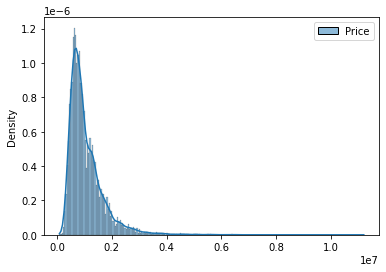

In [12]:
sns.histplot(data=precio, kde=True, stat='density')

La distribución del precio es bastante asimetrica hacia la derecha. Decidimos utiliza entonces la mediana para categorizar el precio  de forma binaria en "Caro" y "Barato" utilizando el punto de corte la mediana.Dandonos nos categorias bastante equilibradas.  


In [13]:
data.sort_values("Price")
mediana= 870000.0
precio_bajo= data[data["Price"]< mediana]
precio_alto= data[data["Price"]>= mediana]

In [14]:
print(len(precio_bajo))
print(len(precio_alto))

13381
13675
